# Signal e- Run 01-02 Analysis

## Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [3]:
import numpy as np
import pandas as pd
import pickle as pkl
import os
from sys import getsizeof
import re
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (12,8)
import plotly.io as pio
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode
from plotly.offline import iplot, plot

In [4]:
init_notebook_mode(True)

In [5]:
from mu2e import mu2e_ext_path
from hallprobecalib.hpcplots import scatter2d, scatter3d, histo

## Testing New Field Function Import

### Test 1: Trajectory Code

In [40]:
from mu2e.tools.modeleval import get_mag_field_function

In [4]:
mag_field_func = get_mag_field_function('Mau13traj',units=('mm','T'),fastcart=True)

recreating fit with func_version=1000,
cfg_params(pitch1=0, ms_h1=0, ns_h1=0, pitch2=0, ms_h2=0, ns_h2=0, length1=10, ms_c1=50, ns_c1=4, length2=0, ms_c2=0, ns_c2=0, ks_dict={'k3': 10000}, bs_tuples=None, bs_bounds=None, version=1000)
Elapsed time was 1.18451 seconds
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 0
    # data points      = 46560
    # variables        = 0
    chi-square         = 764307.395
    reduced chi-square = 16.4155368
    Akaike info crit   = 130285.508
    Bayesian info crit = 130285.508
[[Variables]]
    pitch1:    0 (fixed)
    ms_h1:     0 (fixed)
    ns_h1:     0 (fixed)
    pitch2:    0 (fixed)
    ms_h2:     0 (fixed)
    ns_h2:     0 (fixed)
    length1:   10 (fixed)
    ms_c1:     50 (fixed)
    ns_c1:     4 (fixed)
    length2:   0 (fixed)
    ms_c2:     0 (fixed)
    ns_c2:     0 (fixed)
    Ac1_0_0:  -74613.8 (fixed)
    Bc1_0_0:   13334 (fixed)
    Dc1_0:     0.9452835 (fixed)
    Ac1_0_1:  -439.0484 (fixed)
    Bc1_0_

In [5]:
mag_field_func(0,0,6000)

(0.0036952567880395174, 0.0, 1.4532944820583897)

Great, this is working for use in trajectory code as follows:

In [37]:
import numpy as np
from mu2e.tools.particletransport import ElectronSwimmer

In [7]:
pos = np.array([-3935.3+3904, -15.5, 6004.4])
mom = np.array([91.2,-40.8,32.1])
timesteps = np.linspace(0,4e-8,4001)

In [ ]:
swimmer = ElectronSwimmer(mom,pos,mag_field_func,)

### Test 2: Reconstruct full DS model
- Something is definitely screwy...passing in many values doesn't return the same value as passing one in.

In [5]:
from mu2e.dataframeprod import DataFrameMaker
from mu2e import mu2e_ext_path

In [6]:
df_ds = DataFrameMaker(mu2e_ext_path+'datafiles/Mau13/Mu2e_DSMap_V13',input_type = 'pkl').data_frame

In [7]:
df_ds = df_ds.query("R<.700 and 4.000<Z<12.000")
df_ds = df_ds.reset_index(drop=True)

In [8]:
len(df_ds)

783680

In [41]:
mag_full_reco_func = get_mag_field_function('Mau13traj')

recreating fit with func_version=1000,
cfg_params(pitch1=0, ms_h1=0, ns_h1=0, pitch2=0, ms_h2=0, ns_h2=0, length1=10, ms_c1=50, ns_c1=4, length2=0, ms_c2=0, ns_c2=0, ks_dict={'k3': 10000}, bs_tuples=None, bs_bounds=None, version=1000)
Elapsed time was 1.12389 seconds
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 0
    # data points      = 46560
    # variables        = 0
    chi-square         = 764307.395
    reduced chi-square = 16.4155368
    Akaike info crit   = 130285.508
    Bayesian info crit = 130285.508
[[Variables]]
    pitch1:    0 (fixed)
    ms_h1:     0 (fixed)
    ns_h1:     0 (fixed)
    pitch2:    0 (fixed)
    ms_h2:     0 (fixed)
    ns_h2:     0 (fixed)
    length1:   10 (fixed)
    ms_c1:     50 (fixed)
    ns_c1:     4 (fixed)
    length2:   0 (fixed)
    ms_c2:     0 (fixed)
    ns_c2:     0 (fixed)
    Ac1_0_0:  -74613.8 (fixed)
    Bc1_0_0:   13334 (fixed)
    Dc1_0:     0.9452835 (fixed)
    Ac1_0_1:  -439.0484 (fixed)
    Bc1_0_

In [81]:
df_small = df_ds.sample(n=100000)
#df_small = df_ds.query('Phi==0.')
df_small = df_small.reset_index(drop=True)
#br,bphi,bz = mag_full_reco_func(df_ds.R.values,df_ds.Phi.values,df_ds.Z.values,cart=False)
#bbr,bbphi,bbz = mag_full_reco_func(df_small.R,df_small.Phi,df_small.Z,cart=False)
bbr = []
bbphi = []
bbz = []
for row in df_small.itertuples():
    r = row.R
    phi = row.Phi
    z = row.Z
    br,bphi,bz = mag_full_reco_func(r,phi,z,cart=False)
    bbr.append(br)
    bbphi.append(bphi)
    bbz.append(bz)

In [97]:
%time mag_full_reco_func(df_ds.R[:1000],df_ds.Phi[:1000],df_ds.Z[:1000],cart=False)

CPU times: user 49.8 ms, sys: 260 µs, total: 50.1 ms
Wall time: 8.83 ms


(array([  40.9564047 ,   44.43808061,   46.0638469 ,   46.4005184 ,
          61.34049242,   59.34121643,   57.07976321,   54.77398308,
          76.193222  ,   72.89067725,   70.10342709,   67.85710193,
          66.14612774,   64.9430175 ,   64.20560417,   63.88258771,
         166.93056647,  169.89097014,  173.58631106,  177.81648636,
         182.39769118,  187.16359149,  191.96605869,  196.67559891,
         209.82430164,  214.27774321,  218.33643793,  221.94348689,
         227.36710123,  230.00575913,  232.12405375,  233.73483118,
         458.51933831,  458.30336853,  457.06620869,  455.00542197,
         452.33211627,  449.26256815,  446.00961801,  442.77424375,
         462.95884479,  459.86395692,  457.34476661,  455.49736196,
         480.2084781 ,  479.85800257,  480.34596319,  481.5816797 ,
         659.74053145,  670.11191554,  681.15372259,  692.16700979,
         710.38879566,  719.82217003,  727.33402076,  732.52331437,
         785.36501231,  785.00080779,  781.29065

In [82]:
len(bbr)

100000

In [37]:
#br

array([ 3.36812397e+01, -1.31201085e+00,  2.32070849e+01,  1.43460986e+01,
        3.69875756e+01,  2.91493250e+01,  3.93589776e+01,  4.49784241e+01,
       -9.53284544e+00,  7.13265993e+01, -1.36054363e+01,  7.21423380e+01,
        4.29845062e+00,  7.21424690e+01,  7.28368846e+01,  1.45714994e+01,
       -1.85744401e+00,  1.18495144e+02, -8.00182117e+00,  4.86201883e+01,
        2.18376365e+02,  1.63323485e+02,  2.19142322e+02,  1.09965814e+01,
        3.55197719e+00,  2.26319053e+02,  5.49933201e+01,  1.88315782e+01,
        9.62973245e+01,  1.45133651e+02,  1.61057521e+02,  2.35251885e+02,
        4.44168788e+02,  1.76637004e+01,  4.35192908e+02,  3.87455823e+02,
        3.15659979e+02,  4.25546619e+02,  3.49248882e+01,  4.22427688e+00,
        4.61647357e+01,  4.52084806e+01,  4.39514077e+02,  4.55534336e+02,
        2.47671550e+01,  4.99797740e+02,  1.78175614e+02,  2.32793468e+02,
        4.38386732e+02,  2.25649309e+00,  9.63089741e+01,  6.78341893e+02,
        7.41224348e+02,  

In [38]:
#bphi

array([ 7.34524808e-02,  7.75701285e-01,  4.17746498e-01,  2.88275199e-01,
        2.73368481e-01,  2.02266964e-01, -4.87933734e-01, -2.05819920e-01,
       -4.25031945e-01,  1.54737206e+00,  3.06615808e-01,  2.79909421e-01,
       -2.45459924e+00, -2.97928474e-01, -2.36213986e-01, -6.95962008e-01,
        1.11057457e+00,  3.85013272e-01,  2.78388433e+00, -5.99550142e-01,
        6.31666140e-01,  1.01425438e+00,  3.06175900e-01,  8.25982900e+00,
        3.23566717e+00,  8.76544237e-01,  1.96004967e+00,  4.96530097e+00,
        5.50762251e-01,  3.19099429e-01,  1.08426307e-01, -7.55569014e-01,
       -1.27528909e+00, -7.26216987e+00, -1.82686000e+00,  5.48176782e-01,
       -1.09205245e+01, -6.54472519e-01, -1.22278965e+01, -4.28957216e+00,
       -5.91337413e+00, -2.56679304e+00,  1.96994218e+00, -2.20137348e+00,
        1.57231160e+01, -4.37560676e+00,  5.66840981e-01,  5.09545885e+00,
       -2.33415432e+01,  1.56116399e+01,  5.19776469e+00,  4.83914918e+00,
        3.14778126e-01,  

In [39]:
#bz

array([12959.57379923, 10176.89600136, 18289.64806496, 10111.6800758 ,
       12901.82805279, 18939.24285654, 13906.48021582, 13075.71206569,
       10052.76347688, 18937.48031256, 10180.64322139, 14740.81756356,
       10091.74728897, 16259.13537952, 16324.66058369, 10031.52463292,
        9938.05312199, 11882.50537181, 10114.25577406, 10461.4143191 ,
       16326.73355131, 18633.39541079, 16522.23836851, 10043.00591229,
        9950.4936047 , 16907.73859235, 10499.3818073 , 10151.70587635,
       10661.08009516, 10936.54718014, 11154.70723433, 15997.70949969,
       16066.35628409, 10068.87530936, 16589.4897067 , 13538.65479285,
       11195.4737021 , 16842.25302516, 10328.34542174,  9929.06951847,
       10368.16418875, 10338.62094338, 13995.4375454 , 16839.66248473,
        9976.6434542 , 17284.12858685, 10544.10049943, 11841.59292477,
       18772.55611207, 10129.48591263, 18321.06409698, 13979.67182643,
       12833.17342386, 10134.83144443, 18744.67349973, 10110.90274413,
      

In [83]:
df_small['Br_fit'] = bbr
df_small['Bphi_fit'] = bbphi
df_small['Bz_fit'] = bbz
#df_small['Br_fit'] = br
#df_small['Bphi_fit'] = bphi
#df_small['Bz_fit'] = bz
#df_ds['Br_fit'] = br
#df_ds['Bphi_fit'] = bphi
#df_ds['Bz_fit'] = bz

In [35]:
#df_ds.eval('B_fit = (Br_fit**2+Bphi_fit**2+Bz_fit**2)**(1/2)')

In [84]:
#df_ds[['R','Phi','Z','Br','Bphi','Bz','Br_fit','Bphi_fit','Bz_fit']]
df_small[['R','Phi','Z','Br','Bphi','Bz','Br_fit','Bphi_fit','Bz_fit']]

,R,Phi,Z,Br,Bphi,Bz,Br_fit,Bphi_fit,Bz_fit
0,0.552268,-1.661456,5.496,767.649493,-2.614215,15840.355676,32.744523,0.075711,15864.759342
1,0.691466,2.279423,8.096,107.027162,-0.629673,10288.845147,12.089965,0.076204,10587.370885
2,0.447214,-2.034444,11.996,22.571723,-7.610619,9914.593872,6.333996,-0.552842,9915.987740
3,0.687841,2.808348,7.171,-58.407711,20.663627,11815.735216,15.440635,-0.030370,11955.954443
4,0.676849,0.073939,11.346,54.269916,-5.494490,9968.549931,-10.059399,0.010095,9979.829320
5,0.485412,2.934096,11.646,27.421776,8.390271,9928.958256,11.520813,0.134845,9943.467963
6,0.682825,-0.414507,11.346,58.171792,-8.031375,9968.532450,-8.772268,-0.193458,9979.813923
7,0.412311,1.325818,5.546,548.509337,-6.683480,15726.692824,33.761520,-0.143570,15732.888562
8,0.482830,1.199905,4.146,100.445924,20.808500,18558.590674,30.658283,0.474765,19129.233121
9,0.247487,-2.356194,9.646,28.291419,-12.278322,10162.889179,14.580805,-1.216789,10166.123139


In [85]:
df_small.eval('B = (Br**2+Bphi**2+Bz**2)**(1/2)',inplace=True)
df_small.eval('B_fit = (Br_fit**2+Bphi_fit**2+Bz_fit**2)**(1/2)',inplace=True)
df_small.eval('B_rel_res = (B - B_fit)/B',inplace=True)

df_small.eval('Br_res = Br - Br_fit',inplace=True)
df_small.eval('Bphi_res = Bphi - Bphi_fit',inplace=True)
df_small.eval('Bz_res = Bz - Bz_fit',inplace=True)

In [57]:
df_small

,X,Y,Z,Bx,By,Bz,R,Phi,Bphi,Br,Br_fit,Bphi_fit,Bz_fit,B_rel_res,Br_res,Bphi_res,Bz_res
0,0.575,-0.375,9.846,3.421543,-14.068587,10117.347873,0.686477,-0.577902,-9.914918,10.551137,-12.482515,-0.366626,10142.945252,2.183049,23.033651,-9.548293,-25.597379
1,-0.150,0.575,7.996,-56.111007,254.695785,10381.624072,0.594243,1.825979,-9.996813,260.611687,13.764700,0.022697,10684.579538,0.947183,246.846987,-10.019510,-302.955466
2,-0.025,0.475,8.321,-6.236281,62.487402,10381.618964,0.475657,1.623379,2.943396,62.728805,5.610373,0.356622,10445.450275,0.910561,57.118433,2.586775,-63.831311
3,-0.025,0.125,8.496,-12.454008,8.661293,10382.227600,0.127475,1.768192,10.513540,10.935528,5.007503,1.894912,10383.608936,0.542089,5.928026,8.618629,-1.381336
4,-0.450,-0.425,10.446,-30.473483,-16.922605,10107.227188,0.618971,-2.384758,-8.620854,33.774082,12.561317,-0.557691,10096.087366,0.628078,21.212765,-8.063163,11.139821
5,0.150,0.350,5.546,204.456253,463.112316,15729.369227,0.380789,1.165905,-5.496070,506.206647,47.915977,-0.209684,15732.933856,0.905343,458.290671,-5.286386,-3.564629
6,0.275,0.225,10.596,0.590529,4.659814,10086.370289,0.355317,0.685730,3.232552,3.407814,-10.056607,0.861591,10082.071518,3.951043,13.464422,2.370960,4.298772
7,0.050,0.600,6.571,74.734830,744.108827,13301.961051,0.602080,1.487655,-12.681804,747.744885,42.074462,-0.322639,13134.084390,0.943732,705.670423,-12.359164,167.876661
8,-0.200,-0.400,4.971,-269.120323,-533.782708,17198.116375,0.447214,-2.034444,-1.993651,597.784035,74.259472,-0.182807,17235.638008,0.875775,523.524564,-1.810844,-37.521633
9,-0.150,0.675,8.921,-37.606168,45.971608,10305.298826,0.691466,1.789465,26.738013,53.034812,7.960674,1.231525,10292.784561,0.849897,45.074138,25.506488,12.514265


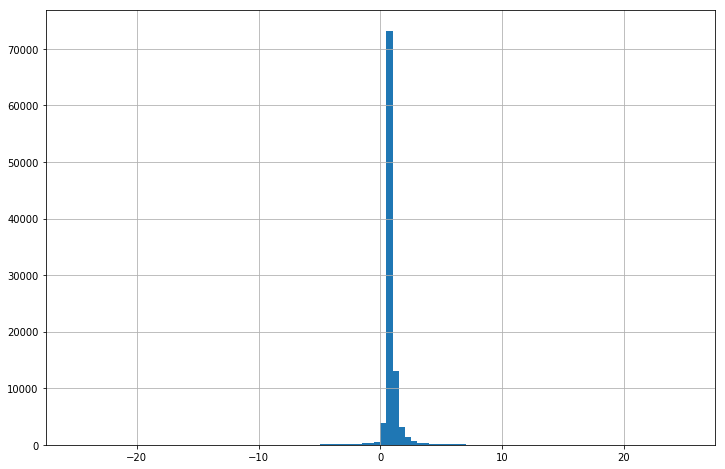

In [93]:
df_small[df_small.notna()].B_rel_res.hist(bins=100,log=False,range=[-25,25])

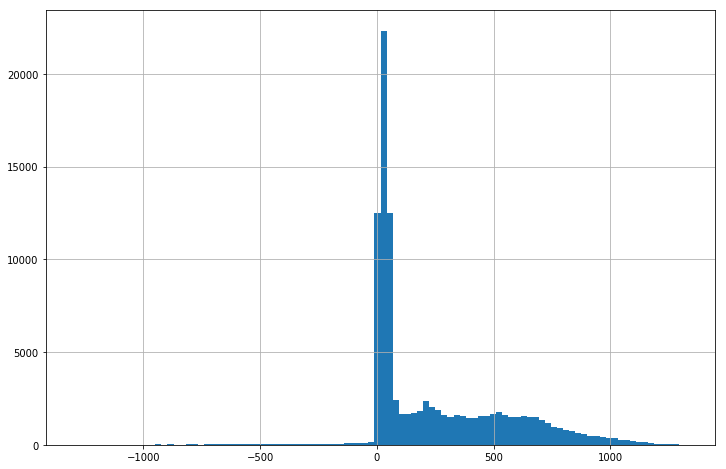

In [94]:
df_small.Br_res.hist(bins=100,log=False)#,range=[-50,50])

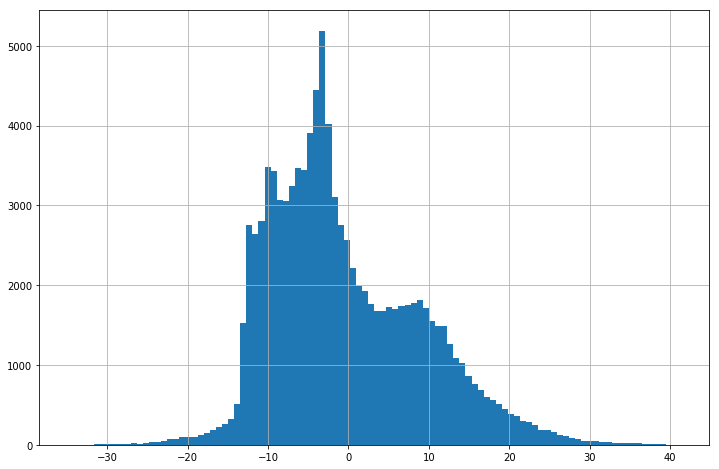

In [95]:
df_small.Bphi_res.hist(bins=100,log=False)#,range=[-50,50])

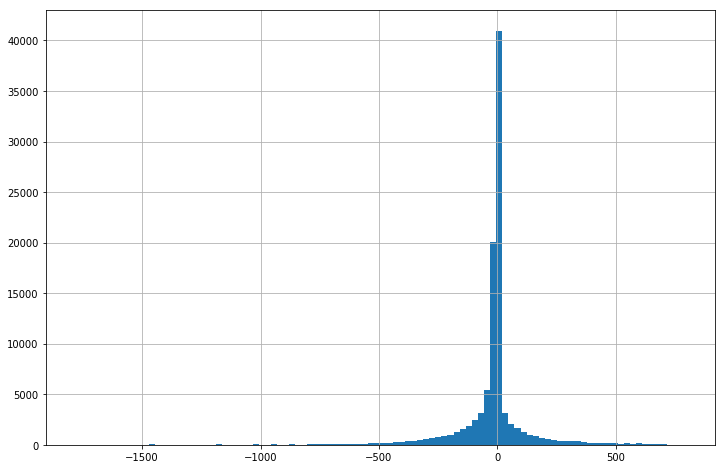

In [96]:
df_small.Bz_res.hist(bins=100,log=False)#,range=[-50,50])

## Exploring Trajectory Run 01-02

### Concat Files to one DataFrame

In [14]:
r_init = re.compile("trajectory.*INIT_COND\.p$")
r_data = re.compile("trajectory.*\d\d\d\.p$")
directory01 = mu2e_ext_path+'trajectory/run01/'
directory02 = mu2e_ext_path+'trajectory/run02/'

In [33]:
init_01 = [directory01+f for f in os.listdir(directory01) if r_init.match(f)]
init_02 = [directory02+f for f in os.listdir(directory02) if r_init.match(f)]
data_01 = sorted([directory01+f for f in os.listdir(directory01) if r_data.match(f)])
data_02 = sorted([directory02+f for f in os.listdir(directory02) if r_data.match(f)])

In [34]:
init_01, init_02

(['/home/ckampa/Coding/Mu2E_Extras/trajectory/run01/trajectory_run01_10e-11step_Dop853_INIT_COND.p'],
 ['/home/ckampa/Coding/Mu2E_Extras/trajectory/run02/trajectory_run02_10e-11step_Dop853_INIT_COND.p'])

In [35]:
data_02

['/home/ckampa/Coding/Mu2E_Extras/trajectory/run02/trajectory_run02_10e-11step_Dop853_000.p',
 '/home/ckampa/Coding/Mu2E_Extras/trajectory/run02/trajectory_run02_10e-11step_Dop853_001.p',
 '/home/ckampa/Coding/Mu2E_Extras/trajectory/run02/trajectory_run02_10e-11step_Dop853_002.p',
 '/home/ckampa/Coding/Mu2E_Extras/trajectory/run02/trajectory_run02_10e-11step_Dop853_003.p',
 '/home/ckampa/Coding/Mu2E_Extras/trajectory/run02/trajectory_run02_10e-11step_Dop853_004.p',
 '/home/ckampa/Coding/Mu2E_Extras/trajectory/run02/trajectory_run02_10e-11step_Dop853_005.p',
 '/home/ckampa/Coding/Mu2E_Extras/trajectory/run02/trajectory_run02_10e-11step_Dop853_006.p',
 '/home/ckampa/Coding/Mu2E_Extras/trajectory/run02/trajectory_run02_10e-11step_Dop853_007.p',
 '/home/ckampa/Coding/Mu2E_Extras/trajectory/run02/trajectory_run02_10e-11step_Dop853_008.p',
 '/home/ckampa/Coding/Mu2E_Extras/trajectory/run02/trajectory_run02_10e-11step_Dop853_009.p',
 '/home/ckampa/Coding/Mu2E_Extras/trajectory/run02/trajector

Now we have lists of files to read in and have separated them by run and type of file. Now we can load in everything and concatenate!

In [119]:
# run 01
# load in all dataframes
df = []
for fname in data_01:
    df_ = pkl.load(open(fname,'rb'))
    df_.eval('run = 1', inplace=True)
    df_.run = df_.run.astype('category')
    df.append(df_)

In [120]:
# concat!
df = pd.concat(df, join='outer', ignore_index=True, sort = False)

In [60]:
df

,X,Y,Z,Vx,Vy,Vz,time,event,E0,EF,run
0,66.465820,-7.295485,5833.322754,9.787533e+10,1.029254e+11,2.640079e+11,0.000000e+00,0,105.001243,105.001356,1
1,67.438190,-6.259770,5835.963511,9.654746e+10,1.041631e+11,2.640114e+11,1.000250e-11,0,105.001243,105.001356,1
2,68.397202,-5.211763,5838.604303,9.520459e+10,1.053830e+11,2.640149e+11,2.000500e-11,0,105.001243,105.001356,1
3,69.342709,-4.151642,5841.245130,9.384698e+10,1.065852e+11,2.640184e+11,3.000750e-11,0,105.001243,105.001356,1
4,70.274563,-3.079586,5843.885992,9.247485e+10,1.077692e+11,2.640219e+11,4.001000e-11,0,105.001243,105.001356,1
5,71.192621,-1.995779,5846.526889,9.108847e+10,1.089351e+11,2.640254e+11,5.001250e-11,0,105.001243,105.001356,1
6,72.096741,-0.900401,5849.167821,8.968807e+10,1.100826e+11,2.640289e+11,6.001500e-11,0,105.001243,105.001356,1
7,72.986785,0.206361,5851.808788,8.827390e+10,1.112115e+11,2.640324e+11,7.001750e-11,0,105.001243,105.001356,1
8,73.862616,1.324323,5854.449790,8.684622e+10,1.123218e+11,2.640359e+11,8.002001e-11,0,105.001243,105.001356,1
9,74.724099,2.453295,5857.090826,8.540526e+10,1.134132e+11,2.640394e+11,9.002251e-11,0,105.001243,105.001356,1


In [62]:
# check size in MB
getsizeof(df) / 1000 / 1000

35.236163999999995

In [121]:
# run 02
df2 = []
for fname in data_02:
    df_ = pkl.load(open(fname,'rb'))
    df_.eval('run = 2', inplace=True)
    df_.run = df_.run.astype('category')
    df2.append(df_)
df2 = pd.concat(df2, join='outer', ignore_index=True, sort = False)

In [67]:
df2

,X,Y,Z,Vx,Vy,Vz,time,event,E0,EF,run
0,35.766846,-15.062604,5988.874512,3.735752e+10,3.058676e+10,2.958754e+11,0.000000e+00,0,105.001243,105.001243,2
1,36.138582,-14.754382,5991.834012,3.697021e+10,3.104135e+10,2.958767e+11,1.000250e-11,0,105.001243,105.001243,2
2,36.506417,-14.441639,5994.793526,3.657755e+10,3.149080e+10,2.958780e+11,2.000500e-11,0,105.001243,105.001243,2
3,36.870298,-14.124426,5997.753052,3.617962e+10,3.193504e+10,2.958793e+11,3.000750e-11,0,105.001243,105.001243,2
4,37.230173,-13.802796,6000.712592,3.577650e+10,3.237402e+10,2.958806e+11,4.001000e-11,0,105.001243,105.001243,2
5,37.585990,-13.476801,6003.672145,3.536825e+10,3.280769e+10,2.958820e+11,5.001250e-11,0,105.001243,105.001243,2
6,37.937698,-13.146496,6006.631711,3.495494e+10,3.323598e+10,2.958833e+11,6.001500e-11,0,105.001243,105.001243,2
7,38.285247,-12.811934,6009.591290,3.453665e+10,3.365885e+10,2.958846e+11,7.001750e-11,0,105.001243,105.001243,2
8,38.628587,-12.473169,6012.550883,3.411346e+10,3.407623e+10,2.958859e+11,8.002001e-11,0,105.001243,105.001243,2
9,38.967671,-12.130257,6015.510488,3.368543e+10,3.448807e+10,2.958872e+11,9.002251e-11,0,105.001243,105.001243,2


In [122]:
df = pd.concat([df,df2], join='outer', ignore_index=True, sort = False)
del df2

In [113]:
getsizeof(df)/1000/1000

57.002368000000004

In [78]:
df

,X,Y,Z,Vx,Vy,Vz,time,event,E0,EF,run
0,66.465820,-7.295485,5833.322754,9.787533e+10,1.029254e+11,2.640079e+11,0.000000e+00,0,105.001243,105.001356,1
1,67.438190,-6.259770,5835.963511,9.654746e+10,1.041631e+11,2.640114e+11,1.000250e-11,0,105.001243,105.001356,1
2,68.397202,-5.211763,5838.604303,9.520459e+10,1.053830e+11,2.640149e+11,2.000500e-11,0,105.001243,105.001356,1
3,69.342709,-4.151642,5841.245130,9.384698e+10,1.065852e+11,2.640184e+11,3.000750e-11,0,105.001243,105.001356,1
4,70.274563,-3.079586,5843.885992,9.247485e+10,1.077692e+11,2.640219e+11,4.001000e-11,0,105.001243,105.001356,1
5,71.192621,-1.995779,5846.526889,9.108847e+10,1.089351e+11,2.640254e+11,5.001250e-11,0,105.001243,105.001356,1
6,72.096741,-0.900401,5849.167821,8.968807e+10,1.100826e+11,2.640289e+11,6.001500e-11,0,105.001243,105.001356,1
7,72.986785,0.206361,5851.808788,8.827390e+10,1.112115e+11,2.640324e+11,7.001750e-11,0,105.001243,105.001356,1
8,73.862616,1.324323,5854.449790,8.684622e+10,1.123218e+11,2.640359e+11,8.002001e-11,0,105.001243,105.001356,1
9,74.724099,2.453295,5857.090826,8.540526e+10,1.134132e+11,2.640394e+11,9.002251e-11,0,105.001243,105.001356,1


In [123]:
# init conditions
df_init = []
# run01
df_ = pkl.load(open(init_01[0],'rb'))
df_.eval('run = 1', inplace=True)
df_.run = df_.run.astype('category')
df_['event'] = df_.index.astype('category')
df_init.append(df_)
# run02
df_ = pkl.load(open(init_02[0],'rb'))
df_.eval('run = 2', inplace=True)
df_.run = df_.run.astype('category')
df_['event'] = df_.index.astype('category')
df_init.append(df_)

In [124]:
df_init = pd.concat(df_init, join='outer', ignore_index=True, sort = False)

In [104]:
getsizeof(df_init) / 1000 / 1000

0.022904

In [125]:
df_init[df_init.event == 0]

,X0,Y0,Z0,Phi0,Theta0,Px0,Py0,Pz0,Pt0,run,event
0,66.465820,-7.295485,5833.322754,0.810542,0.493572,34.280487,36.049238,92.467836,49.746350,1,0
200,35.766846,-15.062604,5988.874512,0.686074,0.161757,13.084339,10.712905,103.629309,16.910537,2,0


Rather than keep a run+event id system, let's keep a single particle # starting from 0 at run1 event0 and incrementing through run1 then run2.

In [126]:
# this is pretty hacky...especially the 200. Should do this on initial import.
#df_init.eval('particle = (run - 1)*200 + event',inplace=True)
# instead do by index!
df_init.eval('particle = index',inplace=True)
df_init.particle = df_init.particle.astype('category')
#df_init.drop(['run','event'],axis=1,inplace=True)

df.eval('particle = (run - 1)*200 + event',inplace=True)
#df.eval('particle = index',inplace=True)
df.particle = df.particle.astype('category')
#df.drop(['run','event'],axis=1,inplace=True)

In [117]:
df_init

,X0,Y0,Z0,Phi0,Theta0,Px0,Py0,Pz0,Pt0,particle
0,66.465820,-7.295485,5833.322754,0.810542,0.493572,34.280487,36.049238,92.467836,49.746350,0
1,-34.604736,23.075880,5677.804199,2.999818,1.648072,-103.636314,14.792215,-8.105847,104.686653,1
2,35.683594,-26.328606,5544.415527,5.876432,1.180329,89.174697,-38.414338,39.965137,97.096796,2
3,-49.699463,27.189085,5544.408691,1.253022,2.780731,11.583711,35.217346,-98.237244,37.073492,3
4,-25.668213,59.989273,5966.639648,1.603715,1.247600,-3.276884,99.509683,33.347940,99.563622,4
5,55.166992,-25.546295,5788.884766,3.436827,2.326291,-73.125966,-22.239228,-71.993124,76.432912,5
6,60.616699,3.578978,5588.841309,1.277956,1.640347,30.237386,100.286868,-7.296884,104.746148,6
7,31.611572,-26.964762,6255.578125,5.297421,2.598771,29.951713,-45.218080,-89.906730,54.238177,7
8,38.190186,34.693359,6055.551758,2.253839,2.331696,-47.994783,58.982963,-72.405185,76.042680,8
9,-14.823242,-15.971301,6166.634766,4.291675,0.852184,-32.279108,-72.143529,69.125758,79.035622,9


In [127]:
df

,X,Y,Z,Vx,Vy,Vz,time,event,E0,EF,run,particle
0,66.465820,-7.295485,5833.322754,9.787533e+10,1.029254e+11,2.640079e+11,0.000000e+00,0,105.001243,105.001356,1,0
1,67.438190,-6.259770,5835.963511,9.654746e+10,1.041631e+11,2.640114e+11,1.000250e-11,0,105.001243,105.001356,1,0
2,68.397202,-5.211763,5838.604303,9.520459e+10,1.053830e+11,2.640149e+11,2.000500e-11,0,105.001243,105.001356,1,0
3,69.342709,-4.151642,5841.245130,9.384698e+10,1.065852e+11,2.640184e+11,3.000750e-11,0,105.001243,105.001356,1,0
4,70.274563,-3.079586,5843.885992,9.247485e+10,1.077692e+11,2.640219e+11,4.001000e-11,0,105.001243,105.001356,1,0
5,71.192621,-1.995779,5846.526889,9.108847e+10,1.089351e+11,2.640254e+11,5.001250e-11,0,105.001243,105.001356,1,0
6,72.096741,-0.900401,5849.167821,8.968807e+10,1.100826e+11,2.640289e+11,6.001500e-11,0,105.001243,105.001356,1,0
7,72.986785,0.206361,5851.808788,8.827390e+10,1.112115e+11,2.640324e+11,7.001750e-11,0,105.001243,105.001356,1,0
8,73.862616,1.324323,5854.449790,8.684622e+10,1.123218e+11,2.640359e+11,8.002001e-11,0,105.001243,105.001356,1,0
9,74.724099,2.453295,5857.090826,8.540526e+10,1.134132e+11,2.640394e+11,9.002251e-11,0,105.001243,105.001356,1,0


Now that we have some nice looking dataframes let's write them out for later use.

In [128]:
pkl.dump(df,open(mu2e_ext_path+'trajectory/traj.run01-02.df.data.p','wb'))
pkl.dump(df_init,open(mu2e_ext_path+'trajectory/traj.run01-02.df.init.p','wb'))

### Exploring Trajectories (Plots)

In [6]:
plotdir = mu2e_ext_path+'trajectory/plots_michael_05-01-19/'

First let's try to load in the newly cleaned datasets.

In [7]:
df_init = pkl.load(open(mu2e_ext_path+'trajectory/traj.run01-02.df.init.p','rb'))
df = pkl.load(open(mu2e_ext_path+'trajectory/traj.run01-02.df.data.p','rb'))

Now we can get some general ideas in trends of positional data. An easy case is how conversion e- populate X and Y. The full data is overkill and a bit unwieldy, so we'll select every 10 data points (1e-10 s).

In [8]:
df_small = df.iloc[::10,:]

In [9]:
getsizeof(df_small)/1000/1000

5.8425839999999996

In [10]:
df_small

,X,Y,Z,Vx,Vy,Vz,time,event,E0,EF,run,particle
0,66.465820,-7.295485,5833.322754,9.787533e+10,1.029254e+11,2.640079e+11,0.000000e+00,0,105.001243,105.001356,1,0
10,75.571105,3.593090,5859.731897,8.395130e+10,1.144856e+11,2.640428e+11,1.000250e-10,0,105.001243,105.001356,1,0
20,83.217763,15.543615,5886.144518,6.875263e+10,1.241351e+11,2.640775e+11,2.000500e-10,0,105.001243,105.001356,1,0
30,89.291285,28.358379,5912.560610,5.254105e+10,1.317480e+11,2.641123e+11,3.000750e-10,0,105.001243,105.001356,1,0
40,93.703891,41.828831,5938.980193,3.558853e+10,1.372335e+11,2.641473e+11,4.001000e-10,0,105.001243,105.001356,1,0
50,96.395314,55.739138,5965.403305,1.817246e+10,1.405367e+11,2.641828e+11,5.001250e-10,0,105.001243,105.001356,1,0
60,97.333117,69.869767,5991.829992,5.710489e+08,1.416385e+11,2.642188e+11,6.001500e-10,0,105.001243,105.001356,1,0
70,96.512533,84.001004,6018.260303,-1.694124e+10,1.405543e+11,2.642553e+11,7.001750e-10,0,105.001243,105.001356,1,0
80,93.955894,97.916366,6044.694286,-3.409784e+10,1.373329e+11,2.642922e+11,8.002001e-10,0,105.001243,105.001356,1,0
90,89.711629,111.405849,6071.131982,-5.064403e+10,1.320548e+11,2.643296e+11,9.002251e-10,0,105.001243,105.001356,1,0


In [11]:
data = [
    #go.Histogram2dContour(
    go.Histogram2d(
        x=df_small['X'],
        y=df_small['Y'],
        colorscale='Viridis',
        #bins
        #line=line(width=0.1)
    )
]

axis_template = dict(
    ticks='',
    showgrid=False,
    zeroline=False,
    showline=True,
    mirror=True,
    linewidth=2,
    linecolor='#444'
)

layout = go.Layout(xaxis=axis_template,
                   yaxis=axis_template,
                   width=800,
                   height=750,
                   autosize=False,
                   hovermode='closest',
                   title='Signal e- Trajectory 2d Histo'
)

fig = go.Figure(data=data, layout=layout)

In [12]:
iplot(fig, filename=mu2e_ext_path+"trajectory/xy_2d_histo_sparse2.html")

In [13]:
grouped = df.groupby('particle')

In [14]:
#zmax = grouped['Z'].agg(np.max)
zmax = grouped['Z'].last()

In [15]:
histo(zmax,xlabel='Z_max (mm)',bins=15,inline=True)
histo(zmax[zmax<6290],xlabel='Z_max (mm)',bins=15,inline=True)
histo(zmax[zmax<8410],xlabel='Z_max (mm)',bins=15,inline=True)

This is slightly concerning. About 50% of all electrons terminate at or before the stopping target. This makes me question the validity of the current implementation of the trajectory code.

In [16]:
start_E = grouped['E0'].first()
end_E = grouped['EF'].last()

In [17]:
e_change = end_E - start_E

In [18]:
e_change.name = ""

In [19]:
histo(e_change,xlabel=f'$\Delta E (MeV)$',yscale='linear',bins=30,inline=True)
histo(e_change,xlabel=f'$\Delta E (MeV)$',yscale='linear',bins=30,cut=[0.,.75],inline=True)

In [20]:
data = [
    #go.Histogram2dContour(
    go.Scatter(
        x=zmax,
        y=e_change,
        mode='markers',
        #colorscale='Viridis',
        #bins
        #line=line(width=0.1)
    )
]

axis_template = dict(
    ticks='',
    showgrid=False,
    zeroline=False,
    showline=True,
    mirror=True,
    linewidth=2,
    linecolor='#444'
)

layout = go.Layout(xaxis=axis_template,
                   yaxis=axis_template,
                   width=800,
                   height=750,
                   autosize=False,
                   hovermode='closest',
                   title=''
)

fig = go.Figure(data=data, layout=layout)

In [21]:
iplot(fig)

In [22]:
zpick = zmax < 6000

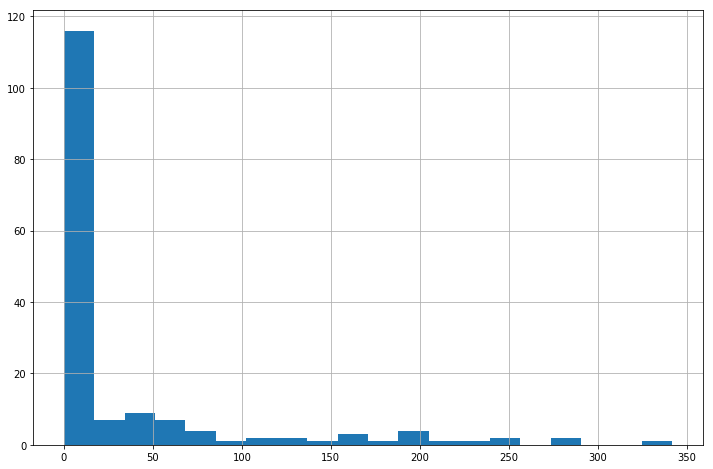

In [23]:
e_change[zpick].hist(bins=20)

So it looks like a large number of the particles terminating in the graded region also have large errors (energy should not change in a magnetic field only region). Let's explore the termination a bit more.

In [24]:
start = grouped.first()
end = grouped.last()

In [25]:
end

,X,Y,Z,Vx,Vy,Vz,time,event,E0,EF,run
particle,,,,,,,,,,,
0,-121.996594,191.183106,12000.506576,-1.079638e+11,-8.438997e+10,2.666375e+11,2.317579e-08,0,105.001243,105.001356,1
1,-79.246435,170.280800,5201.885815,-2.997625e+11,-3.791435e+09,-1.702296e+09,4.000000e-08,1,105.001243,185.517940,1
2,410.976006,50.217364,10429.712651,9.982468e+10,2.537627e+11,1.245511e+11,4.000000e-08,2,105.001243,106.650853,1
3,-131.291950,116.323720,3999.830534,-1.051062e+11,-1.915852e+10,-2.801054e+11,5.511378e-09,3,105.001243,105.001366,1
4,-82.909607,327.109392,10030.300291,-2.377961e+11,1.488646e+11,1.056683e+11,4.000000e-08,4,105.001243,106.160018,1
5,14.685310,-82.030963,3999.120931,-1.678496e+11,-1.414116e+11,-2.042124e+11,8.742186e-09,5,105.001243,105.968714,1
6,118.502801,-200.572567,5253.150646,2.160486e+11,2.078283e+11,2.293119e+09,4.000000e-08,6,105.001243,188.887034,1
7,65.229210,-19.210021,3999.492402,1.002536e+11,-1.210015e+11,-2.553062e+11,8.822206e-09,7,105.001243,105.015601,1
8,-223.839020,-19.316296,3999.929598,-8.229195e+10,-2.056008e+11,-2.020638e+11,1.006252e-08,8,105.001243,106.075224,1


It seems interesting to pick out a certain particle that terminated early to look at a 3d plot of the trajectory. e.g. particle 1 ends in the graded region but only terminated because of hitting the maximum time.

In [26]:
p1 = grouped.get_group(1)

In [27]:
p1 = p1.iloc[::10,:]

In [28]:
df_init.query("particle == 1")

,X0,Y0,Z0,Phi0,Theta0,Px0,Py0,Pz0,Pt0,run,event,particle
1,-34.604736,23.07588,5677.804199,2.999818,1.648072,-103.636314,14.792215,-8.105847,104.686653,1,1,1


Very large initial Pt!

In [29]:
p1

,E0,EF,Vx,Vy,Vz,X,Y,Z,event,run,time
2318,105.001243,185.51794,-2.958954e+11,4.223373e+10,-2.314327e+10,-34.604736,23.075880,5677.804199,1,1,0.000000e+00
2328,105.001243,185.51794,-2.988817e+11,2.987063e+09,-2.311217e+10,-64.394160,25.340735,5675.490908,1,1,1.000250e-10
2338,105.001243,185.51794,-2.966873e+11,-3.629255e+10,-2.308420e+10,-94.223197,23.672607,5673.180514,1,1,2.000500e-10
2348,105.001243,185.51794,-2.893492e+11,-7.495914e+10,-2.305522e+10,-123.574841,18.100622,5670.872950,1,1,3.000750e-10
2358,105.001243,185.51794,-2.769992e+11,-1.123154e+11,-2.302371e+10,-151.940358,8.720952,5668.568403,1,1,4.001000e-10
2368,105.001243,185.51794,-2.598568e+11,-1.477137e+11,-2.298898e+10,-178.828717,-4.302609,5666.267164,1,1,5.001250e-10
2378,105.001243,185.51794,-2.382241e+11,-1.805434e+11,-2.295071e+10,-203.774999,-20.743344,5663.969575,1,1,6.001500e-10
2388,105.001243,185.51794,-2.124802e+11,-2.102398e+11,-2.290875e+10,-226.348401,-40.315663,5661.675998,1,1,7.001750e-10
2398,105.001243,185.51794,-1.830745e+11,-2.362931e+11,-2.286307e+10,-246.159621,-62.680162,5659.386803,1,1,8.002001e-10
2408,105.001243,185.51794,-1.505190e+11,-2.582576e+11,-2.281368e+10,-262.867510,-87.449588,5657.102364,1,1,9.002251e-10


In [30]:
scatter3d(p1.X,p1.Y,p1.Z,scale_list=[p1.time],mode_list=['markers+lines'],units_list=[('mm','mm','mm')],inline=True)

Figure({
    'data': [{'marker': {'cauto': False,
                         'cmax': 3.990997749437359e-08,
                         'cmin': 0.0,
                         'color': array([0.00000000e+00, 1.00025006e-10, 2.00050013e-10, ..., 3.97099275e-08,
                                         3.98099525e-08, 3.99099775e-08]),
                         'colorbar': {'thickness': 20, 'title': 'time (mm)', 'x': -0.1, 'y': 0.5},
                         'colorscale': 'Viridis',
                         'opacity': 0.8,
                         'reversescale': False,
                         'showscale': True,
                         'size': 2},
              'mode': 'markers+lines',
              'name': '<br>x: X (mm)<br>y: Y (mm)<br>z: Z (mm)<br>',
              'type': 'scatter3d',
              'uid': '07d26a9b-4483-456d-ad40-377bb16fc6b4',
              'x': array([-34.60473633, -64.39416014, -94.22319729, ...,   7.0404788 ,
                          -22.44552958, -52.27240389]),
     

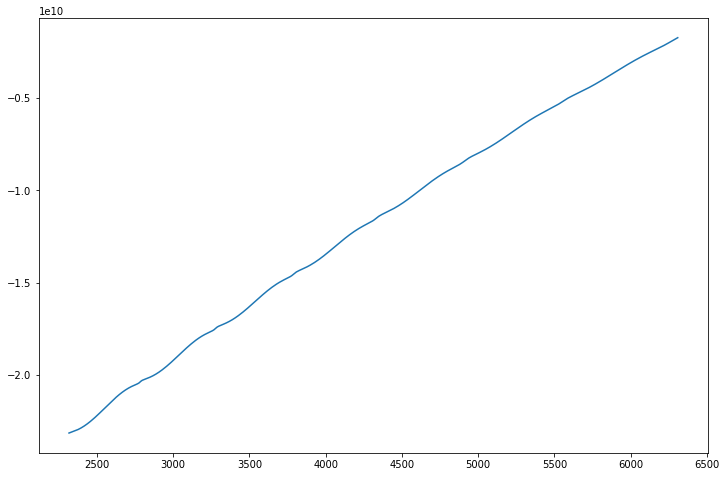

In [31]:
p1.Vz.plot(x='time')

Let's see how the energy changes in time.

In [32]:
c = 299792458000 #mm/s
m = .511 #MeV/c^2

In [33]:
p1.eval('v = (Vx**2+Vy**2+Vz**2)**(1/2)',inplace=True)
p1.eval(f'gamma = (1-(v/{c})**2)**(-1/2)',inplace=True)
p1.eval(f'p = gamma*{m}*v/{c}',inplace=True)

In [34]:
p1

,E0,EF,Vx,Vy,Vz,X,Y,Z,event,run,time,v,gamma,p
2318,105.001243,185.51794,-2.958954e+11,4.223373e+10,-2.314327e+10,-34.604736,23.075880,5677.804199,1,1,0.000000e+00,2.997889e+11,205.481885,105.000000
2328,105.001243,185.51794,-2.988817e+11,2.987063e+09,-2.311217e+10,-64.394160,25.340735,5675.490908,1,1,1.000250e-10,2.997889e+11,205.636249,105.078881
2338,105.001243,185.51794,-2.966873e+11,-3.629255e+10,-2.308420e+10,-94.223197,23.672607,5673.180514,1,1,2.000500e-10,2.997889e+11,205.669899,105.096076
2348,105.001243,185.51794,-2.893492e+11,-7.495914e+10,-2.305522e+10,-123.574841,18.100622,5670.872950,1,1,3.000750e-10,2.997889e+11,205.810401,105.167874
2358,105.001243,185.51794,-2.769992e+11,-1.123154e+11,-2.302371e+10,-151.940358,8.720952,5668.568403,1,1,4.001000e-10,2.997889e+11,205.967310,105.248055
2368,105.001243,185.51794,-2.598568e+11,-1.477137e+11,-2.298898e+10,-178.828717,-4.302609,5666.267164,1,1,5.001250e-10,2.997889e+11,206.125107,105.328690
2378,105.001243,185.51794,-2.382241e+11,-1.805434e+11,-2.295071e+10,-203.774999,-20.743344,5663.969575,1,1,6.001500e-10,2.997889e+11,206.283798,105.409782
2388,105.001243,185.51794,-2.124802e+11,-2.102398e+11,-2.290875e+10,-226.348401,-40.315663,5661.675998,1,1,7.001750e-10,2.997889e+11,206.443388,105.491333
2398,105.001243,185.51794,-1.830745e+11,-2.362931e+11,-2.286307e+10,-246.159621,-62.680162,5659.386803,1,1,8.002001e-10,2.997889e+11,206.603881,105.573346
2408,105.001243,185.51794,-1.505190e+11,-2.582576e+11,-2.281368e+10,-262.867510,-87.449588,5657.102364,1,1,9.002251e-10,2.997890e+11,206.765282,105.655823


In [35]:
#p1.eval(f"E = (p**2*{c}**2+{m}**2*{c}**4)**(1/2)",inplace=True)
p1.eval(f"E = (p**2+{m}**2)**(1/2)",inplace=True)

In [36]:
p1

,E0,EF,Vx,Vy,Vz,X,Y,Z,event,run,time,v,gamma,p,E
2318,105.001243,185.51794,-2.958954e+11,4.223373e+10,-2.314327e+10,-34.604736,23.075880,5677.804199,1,1,0.000000e+00,2.997889e+11,205.481885,105.000000,105.001243
2328,105.001243,185.51794,-2.988817e+11,2.987063e+09,-2.311217e+10,-64.394160,25.340735,5675.490908,1,1,1.000250e-10,2.997889e+11,205.636249,105.078881,105.080123
2338,105.001243,185.51794,-2.966873e+11,-3.629255e+10,-2.308420e+10,-94.223197,23.672607,5673.180514,1,1,2.000500e-10,2.997889e+11,205.669899,105.096076,105.097318
2348,105.001243,185.51794,-2.893492e+11,-7.495914e+10,-2.305522e+10,-123.574841,18.100622,5670.872950,1,1,3.000750e-10,2.997889e+11,205.810401,105.167874,105.169115
2358,105.001243,185.51794,-2.769992e+11,-1.123154e+11,-2.302371e+10,-151.940358,8.720952,5668.568403,1,1,4.001000e-10,2.997889e+11,205.967310,105.248055,105.249295
2368,105.001243,185.51794,-2.598568e+11,-1.477137e+11,-2.298898e+10,-178.828717,-4.302609,5666.267164,1,1,5.001250e-10,2.997889e+11,206.125107,105.328690,105.329930
2378,105.001243,185.51794,-2.382241e+11,-1.805434e+11,-2.295071e+10,-203.774999,-20.743344,5663.969575,1,1,6.001500e-10,2.997889e+11,206.283798,105.409782,105.411021
2388,105.001243,185.51794,-2.124802e+11,-2.102398e+11,-2.290875e+10,-226.348401,-40.315663,5661.675998,1,1,7.001750e-10,2.997889e+11,206.443388,105.491333,105.492571
2398,105.001243,185.51794,-1.830745e+11,-2.362931e+11,-2.286307e+10,-246.159621,-62.680162,5659.386803,1,1,8.002001e-10,2.997889e+11,206.603881,105.573346,105.574583
2408,105.001243,185.51794,-1.505190e+11,-2.582576e+11,-2.281368e+10,-262.867510,-87.449588,5657.102364,1,1,9.002251e-10,2.997890e+11,206.765282,105.655823,105.657059


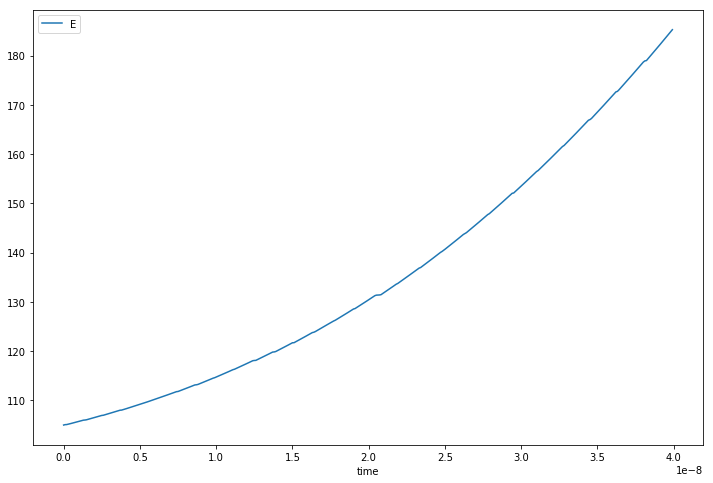

In [37]:
p1.plot(x="time",y="E")

In [237]:
#select = df_small.particle.isin([1,2,3,4,5])

In [40]:
#z_cut = end.Z > 6000
z_cut = end.Z > 8410

z_good = list(end[z_cut].index.values)

zz_cut = df.particle.isin(z_good)

In [41]:
df = df[zz_cut]

In [42]:
df.particle.unique()

[0, 2, 4, 9, 12, ..., 294, 295, 296, 298, 299]
Length: 123
Categories (123, int64): [0, 2, 4, 9, ..., 295, 296, 298, 299]

For now, we've filtered out all particles that stop before the tracker, as they shouldn't affect our weights. Working with custom binning seems nice. In particular, I'd like the center of each bin to correspond to a potential x location in the Mau13 25mm spacing grid.

In [43]:
df_small = df.iloc[::10,:]
'''
#####################
#z_cut = end.Z > 6000
#z_cut = end.Z > 8410

#z_good = list(end[z_cut].index.values)

zz_cut = df_small.particle.isin(z_good)


#df_small = pkl.load(open(mu2e_ext_path+'trajectory/traj.run01-02.df.data.p','rb'))
#df_small = df_small[zz_cut]
df = df_small
'''

"\n#####################\n#z_cut = end.Z > 6000\n#z_cut = end.Z > 8410\n\n#z_good = list(end[z_cut].index.values)\n\nzz_cut = df_small.particle.isin(z_good)\n\n\n#df_small = pkl.load(open(mu2e_ext_path+'trajectory/traj.run01-02.df.data.p','rb'))\n#df_small = df_small[zz_cut]\ndf = df_small\n"

In [44]:
data = [
    #go.Histogram2dContour(
    go.Histogram2d(
        x=df_small['X'],
        y=df_small['Y'],
        colorscale='Viridis',
        #histnorm='probability',
        autobinx=False,
        xbins=dict(
            start=-612.5,
            end=612.5,
            size=25
        ),
        autobiny=False,
        ybins=dict(
            start=-612.5,
            end=612.5,
            size=25
        ),
    )
]
'''
#nbins = 25
#nbins = 75
nbins = 150

data = [
    #go.Histogram2dContour(
    go.Histogram2d(
        x=df_small['X'],
        y=df_small['Y'],
        colorscale='Viridis',
        #histnorm='probability',
        #autobinx=False,
        #xbins=25,
        nbinsx=nbins,
        nbinsy=nbins,
        #bins
        #line=line(width=0.1)
    )
]
'''

axis_template = dict(
    ticks='',
    showgrid=False,
    zeroline=False,
    showline=True,
    mirror=True,
    linewidth=2,
    linecolor='#444'
)

xaxis = dict(
    ticks='',
    showgrid=False,
    zeroline=False,
    showline=True,
    mirror=True,
    linewidth=2,
    linecolor='#444',
    title='X (mm)'
)

yaxis = dict(
    ticks='',
    showgrid=False,
    zeroline=False,
    showline=True,
    mirror=True,
    linewidth=2,
    linecolor='#444',
    title='Y (mm)'
)


layout = go.Layout(xaxis=xaxis,
                   yaxis=yaxis,
                   width=800,
                   height=750,
                   autosize=False,
                   hovermode='closest',
                   title='Signal e- Trajectory 2d Histo'
)

fig = go.Figure(data=data, layout=layout)

In [345]:
#plot(fig, filename=plotdir+"xy_2d_histo_coarse.html")
#plot(fig, filename=plotdir+"xy_2d_histo_finer.html")
plot(fig, filename=plotdir+"xy_2d_histo_1e-10s_steps.html")

'file:///home/ckampa/Coding/Mu2E_Extras/trajectory/plots_michael_05-01-19/xy_2d_histo_1e-10s_steps.html'

In [338]:
#plot(fig, filename=plotdir+"xy_2d_histo_full.html")

'file:///home/ckampa/Coding/Mu2E_Extras/trajectory/plots_michael_05-01-19/xy_2d_histo_full.html'

In [45]:
iplot(fig, filename=plotdir+"xy_2d_histo_1e-10s_steps.html")

In [48]:
df_small.eval('R = (X**2+Y**2)**(1/2)',inplace=True)

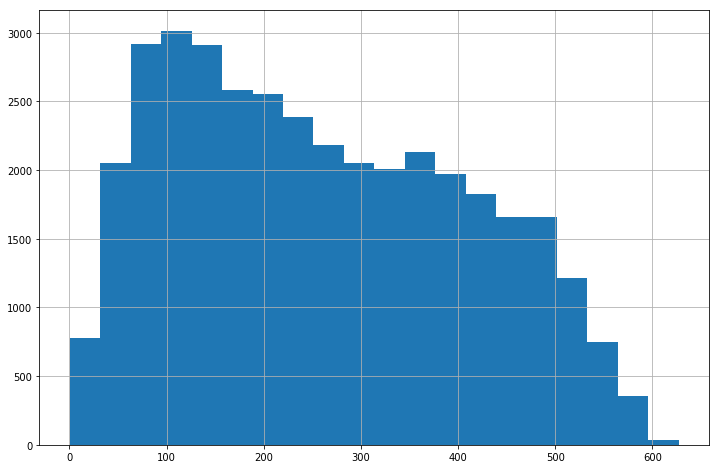

In [49]:
df_small['R'].hist(bins=20)